In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dependencies

In [2]:
#Dependencies to load the dataset in tf.data format
!pip install med_dataloader==0.1.12 -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 15.0 MB/s eta 0:00:00


In [3]:
#Link colab to the directories of a given google drive account
import os
from google.colab import drive
ROOT_PATH = os.path.join(os.sep, 'content' , 'gdrive')
drive.mount(ROOT_PATH)

Mounted at /content/gdrive


#**Project Workshop Notebook**
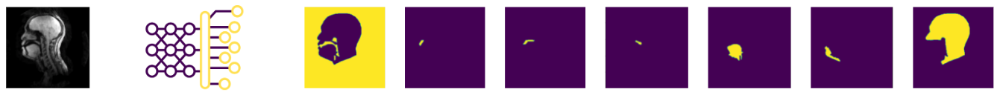

In [4]:
#Possible usefull dependencies
import med_dataloader as mdl
import numpy as np

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
import keras

from datetime import datetime
from dateutil.tz import gettz
import SimpleITK as sitk

import scipy
import cv2


In [5]:
WD_PATH = os.path.join(ROOT_PATH, 'My Drive', 'My_ProjectWorkshop_2425')

DATASET_PATH = os.path.join(WD_PATH, 'Dataset', 'Dataset_SP') #Move the folder containig dataset (e.g. Dataset_SP) into WD_PATH

MODELS_PATH = os.path.join(WD_PATH, 'Models') #Folder where best trained models will be saved
if not os.path.exists(MODELS_PATH):
    os.mkdir(MODELS_PATH)


## Data Loader

tf.data --> numpy.array

In [6]:
#Parameters as global variables
NUM_CLASSES = 7
BATCH_SIZE = 8
EPOCHS = 70

#Data augmentation *args (not necessary)
DATA_AUGMENTATION = False
ROTATION = False
FLIP = False
CROP_SIZE = None

#Percentages for dataset splitting
PERC_TRAIN_DATA = 0.8               #Percentage of the total dataset that will be used for training --> backpropagation and updating of weights and bias are based only on this data
PERC_VALIDATION_DATA = 0.1          #Percentage of the total dataset that will be used during training to evaluate if the Net is overfitting
PERC_TEST_DATA = 0.1                #Percentage of the total dataset that will be used after training to evaluate the global Net performances


"""
train_ds, validation_ds, test_ds are iterators wich contains:
        1) tensors of shape [BATCH_SIZE, x, y, CHANNELS] for MRI images,
        2) tensors of shape [BATCH_SIZE, x, y, NUM_CLASSES] for labels.

divided according to the percentages
"""

train_ds, validation_ds, test_ds = mdl.get_dataset(data_dir = DATASET_PATH,
                                                    percentages = [PERC_TRAIN_DATA, PERC_VALIDATION_DATA, PERC_TEST_DATA],
                                                    batch_size = BATCH_SIZE,
                                                    train_augmentation = DATA_AUGMENTATION,
                                                    random_crop_size = CROP_SIZE,
                                                    random_rotate = ROTATION,
                                                    random_flip = FLIP,
                                                    )


"""
for simplicity we itrate over the abovementioned iterators to fill the numpy tensors.
Iterators are faster and more efficient than numpy.array, but to be manipulated (e.g. preprocessing)
they require high-level python programming, for this reason you will manipulate numpy.array.
"""
#Empty lists filled from the 3 cicles
x_train = []
y_train = []
x_val = []
y_val = []
x_test = []
y_test = []

i = 0
for img, lbl in train_ds.unbatch():
    x_train.append(img)
    y_train.append(lbl)
    i += 1

for img, lbl in validation_ds.unbatch():
    x_val.append(img)
    y_val.append(lbl)
    i += 1

for img, lbl in test_ds.unbatch():
    x_test.append(img)
    y_test.append(lbl)
    i += 1

print('Tot Imgs: {}'.format(i))

#From list to tensor
x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_val = np.asarray(x_val)
y_val = np.asarray(y_val)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

#Some info
print('x_train shape: {}  y_train shape: {}'.format(x_train.shape, y_train.shape))
print('x_val shape: {}  y_val shape: {}'.format(x_val.shape, y_val.shape))
print('x_test shape: {}  y_test shape: {}'.format(x_test.shape, y_test.shape))

Tot Imgs: 820
x_train shape: (656, 256, 256, 1)  y_train shape: (656, 256, 256, 7)
x_val shape: (82, 256, 256, 1)  y_val shape: (82, 256, 256, 7)
x_test shape: (82, 256, 256, 1)  y_test shape: (82, 256, 256, 7)


## Preprocessing

### Choose the right kernel size for Median filter

In [8]:
filtered_3 = cv2.medianBlur(x_train[0], 3)
filtered_5 = cv2.medianBlur(x_train[0], 5)

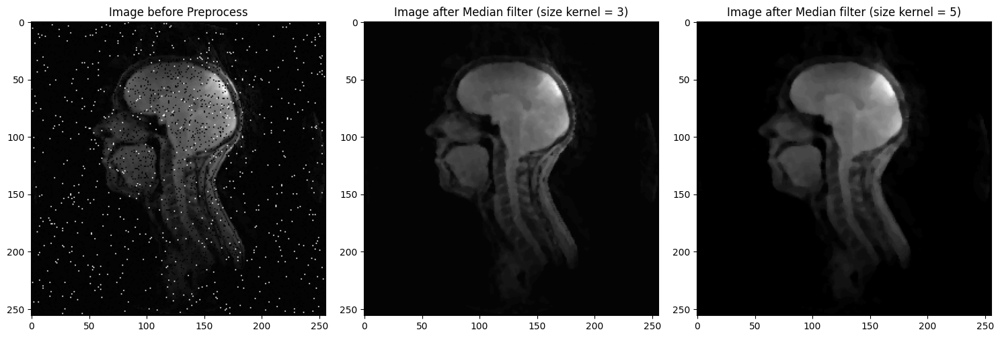

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))

ax[0].imshow(x_train[0], cmap='gray')
ax[0].set_title("Image before Preprocess")

ax[1].imshow(filtered_3, cmap='gray')
ax[1].set_title("Image after Median filter (size kernel = 3)")

ax[2].imshow(filtered_5, cmap='gray')
ax[2].set_title("Image after Median filter (size kernel = 5)")

plt.tight_layout()
plt.show()

### Apply preprocessing on all images

In [10]:
def preprocess_images(images):
    """
    Input : images
    Output : processed_images (median filter)
    """
    processed_images = []
    for image in images:
        # Remove grayscale channel
        image = np.squeeze(image, axis=-1)

        # Apply median filter
        image = cv2.medianBlur(image, 3)  #kernel size (3)

        processed_images.append(image[..., np.newaxis])
    return np.array(processed_images)


x_train = preprocess_images(x_train)
x_val = preprocess_images(x_val)
x_test = preprocess_images(x_test)

print('x_train shape: {}'.format(x_train.shape))
print('x_val shape: {}'.format(x_val.shape))
print('x_test shape: {}'.format(x_test.shape))

x_train shape: (656, 256, 256, 1)
x_val shape: (82, 256, 256, 1)
x_test shape: (82, 256, 256, 1)


In [11]:
import json

# Percorso del file
ds_property_path = '/content/gdrive/My Drive/My_ProjectWorkshop_2425/Dataset/Dataset_SP/ds_property.json'

# Carica e stampa il contenuto
with open(ds_property_path, 'r') as f:
    ds_property = json.load(f)

print(json.dumps(ds_property, indent=4))  # Mostra il contenuto in formato leggibile

{
    "is3D": true,
    "input_size": 256,
    "imgA_label": "SP_images",
    "imgB_label": "Segmentation_checked",
    "imgA_type": "uint8",
    "imgB_type": "uint8",
    "is_A_RGB": true,
    "is_B_RGB": false,
    "is_B_categorical": true,
    "num_classes": 7,
    "norm_boundsA": [
        0,
        255
    ],
    "norm_boundsB": null,
    "use_3D": false
}


## Dataset Visualization

  Img n°: 0 ↓ 


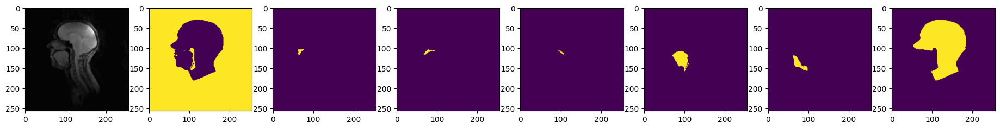

  Img n°: 1 ↓ 


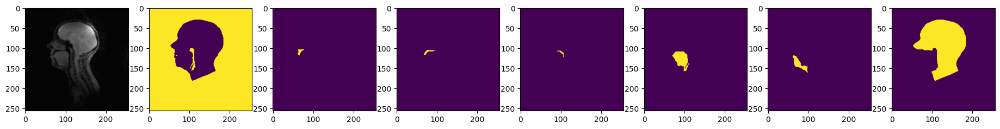

  Img n°: 2 ↓ 


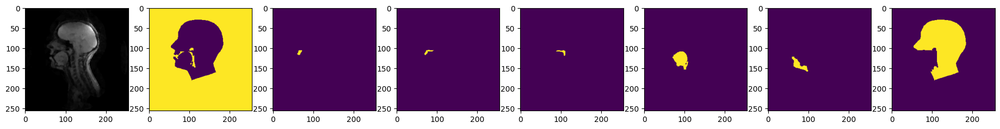

  Img n°: 3 ↓ 


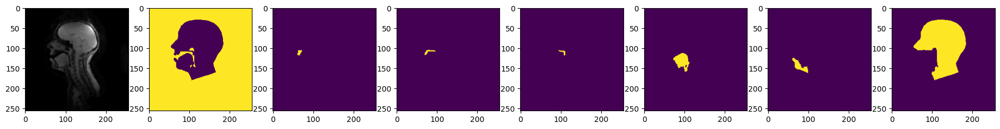

  Img n°: 4 ↓ 


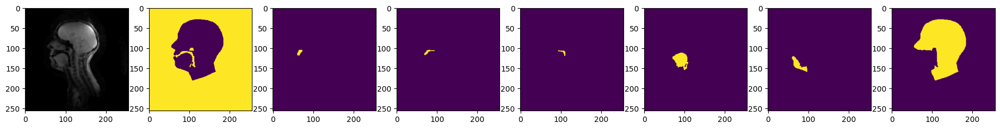

In [12]:
n = 0
for volume, label in zip(x_train, y_train):
    if n >= 5:
        break

    print("\033[92m \033[1m Img n°: {} ↓ \033[0m".format(n))
    fig = plt.figure(figsize = [23, 7])
    plt.subplot(1, NUM_CLASSES + 1, 1)
    plt.imshow(volume[:,:,0], cmap="gray")

    for i in range(NUM_CLASSES):
        plt.subplot(1, NUM_CLASSES + 1, i+2)
        plt.imshow(label[:,:,i])

    n += 1
    plt.show(fig)

## Metric


**Mean Dice** [[1]](https://bmcmedimaging.biomedcentral.com/track/pdf/10.1186/s12880-015-0068-x.pdf)

$$\ \frac{1}{C}  \sum_{c = 1}^{C} \frac{2 \lvert S_g^c \cap S_p^c \rvert}{\lvert S_g^c \rvert + \lvert S_p^c \rvert} = \frac{2\,\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c\,p_i^c}{\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c \,+\, \sum_{c=1}^{C}\sum_{i=1}^{N}p_i^c  } \quad $$

\[ Measure of the similarity between two sets, A and B. \]

In [13]:
class Mean_DICE(tf.keras.metrics.Metric):
    def __init__(self, num_classes, smooth_factor=1e-9, name="Mean_DICE", **kwargs):
        super(Mean_DICE, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.smooth_factor = smooth_factor
        self.mean_dice = self.add_weight(name="mean_dice", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)

        if len(y_pred.shape) == 4:  # 2D images
            axis = (1, 2)
        elif len(y_pred.shape) == 5:  # 3D volumes
            axis = (1, 2, 3)
        else:
            raise ValueError("Unsupported shape for y_pred.")

        dice_classes = 0.0

        for c in range(self.num_classes):
            abs_label = tf.reduce_sum(y_true[..., c], axis=axis)
            abs_pred = tf.reduce_sum(y_pred[..., c], axis=axis)
            intersection = tf.reduce_sum(y_true[..., c] * y_pred[..., c], axis=axis)

            numerator = 2.0 * intersection + self.smooth_factor
            denominator = abs_label + abs_pred + self.smooth_factor
            dice_image = numerator / denominator

            dice_classes += tf.reduce_mean(dice_image)

        mean_dice = dice_classes / self.num_classes
        self.mean_dice.assign(mean_dice)

    def result(self):
        return self.mean_dice

    def reset_states(self):
        self.mean_dice.assign(0.0)

    def get_config(self):
        config = super().get_config()
        config.update({"num_classes": self.num_classes, "smooth_factor": self.smooth_factor})
        return config


## Loss Function

**Cross Entropy** [[1]](https://www.sciencedirect.com/science/article/pii/S1361841521000815)
  $$\mathcal{L}_{CE} = -\sum_{c=1}^{C} \frac{1}{N} \sum_{i=1}^{N} g_i^c\,log\,p_i^c $$

where:
* $C$ = n°classes
* $N$ = n°pixels of image (256x256)
* $g_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the ground truth label
* $p_i^c$ = value of the $i^{th}$ pixel of the $c^{th}$ class of the predicted label

In [14]:
def cross_entropy(num_classes):
    def loss(y_true, y_pred): #called each iteration (step)

        if len(y_pred.shape) == 4: #2D image
            axis = (1,2)
        elif len(y_pred.shape) == 5: #3D volume
            axis = (1,2,3)

        y_true = tf.cast(y_true, dtype = tf.float32)
        y_pred = tf.cast(y_pred, dtype = tf.float32)

        loss_image = 0.0
        loss_ce = 0.0

        for c in range(num_classes):

            loss_image = tf.math.add(-1*(tf.math.reduce_mean(tf.math.multiply(y_true[...,c], tf.math.log(y_pred[...,c] + 1e-9)), axis = axis)), loss_image)

        loss_ce = tf.math.reduce_mean(loss_image)

        return loss_ce

    return loss

**Combined Loss Formula**
$$\, \mathcal{L}_{Total} = α\mathcal{L}_{DICE} + (1-α)\mathcal{L}_{CE}$$

with:
* $\mathcal{L}_{\text{Dice}} = 1 - \frac{2 \sum_{c=1}^{C} \sum_{i=1}^{N} p_{ci} g_{ci} + \epsilon}{\sum_{c=1}^{C} \sum_{i=1}^{N} p_{ci} + g_{ci} + \epsilon}$

* $\mathcal{L}_{CE} = -\sum_{c=1}^{C} \frac{1}{N} \sum_{i=1}^{N} g_i^c\,log\,p_i^c $


where:
* $α ∈ [0,1]$ is a weighting factor that balances CE and Dice.
* $ϵ$ is a small number (e.g., 1e-6) to avoid division by zero.
* $C$: number of classes
* $N$: number of pixels

In [15]:
class DiceCELoss(tf.keras.losses.Loss):
    def __init__(self, alpha=0.5, beta=0.5, reduction=tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE, name="DiceCE"):
        super(DiceCELoss, self).__init__(reduction=reduction, name=name)
        self.alpha = alpha
        self.beta = beta

    def dice_loss(self, y_true, y_pred):
        smooth = 1e-6  # Smoothing term to avoid division by zero
        numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=(1, 2)) #(batch, height, width, num_classes)
        denominator = tf.reduce_sum(y_true + y_pred, axis=(1, 2))
        dice_score = (numerator + smooth) / (denominator + smooth)
        return 1 - tf.reduce_mean(dice_score)  # Average over batch

    def categorical_crossentropy_loss(self, y_true, y_pred):
        return tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_true, y_pred))

    def call(self, y_true, y_pred):
        dice = self.dice_loss(y_true, y_pred)
        cross_entropy = self.categorical_crossentropy_loss(y_true, y_pred)
        return self.alpha * dice + self.beta * cross_entropy

    def get_config(self):
        config = super().get_config()
        config.update({
            "alpha": self.alpha,
            "beta": self.beta,
        })
        return config

In [16]:
class DiceFocalLoss(tf.keras.losses.Loss):
  def __init__(self, alpha=0.5, beta=0.5, reduction=tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE, name="DiceFocal"):
    super(DiceFocalLoss, self).__init__(reduction=reduction, name=name)
    self.alpha = alpha
    self.beta = beta

  def dice_loss(self, y_true, y_pred):
    smooth = 1e-6  # Smoothing term to avoid division by zero
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=(1, 2)) #(batch, height, width, num_classes)
    denominator = tf.reduce_sum(y_true + y_pred, axis=(1, 2))
    dice_score = (numerator + smooth) / (denominator + smooth)
    return 1 - tf.reduce_mean(dice_score)  # Average over batch

  def focal_loss(self, y_true, y_pred):
    return tf.reduce_mean(tf.keras.losses.CategoricalFocalCrossentropy(alpha=0.25, gamma=2.0)(y_true, y_pred))

  def call(self, y_true, y_pred):
    dice = self.dice_loss(y_true, y_pred)
    focal = self.focal_loss(y_true, y_pred)
    return self.alpha * dice + self.beta * focal

  def get_config(self):
    config = super().get_config()
    config.update({
        "alpha": self.alpha,
        "beta": self.beta,
    })
    return config

## Architectures

In [17]:
def residual_block(input_tensor, filters, kernel_size=3, stack = 2, name = None):

  x = layers.Conv2D(filters, kernel_size=3, padding='same', name=f'{name}_conv_1')(input_tensor)
  x = layers.BatchNormalization(name=f'{name}_bn_1')(x)
  x = layers.Activation('relu', name=f'{name}_relu_1')(x)

  if stack == 2:
    x = layers.Conv2D(filters, kernel_size=3, padding='same', name=f'{name}_conv_2')(x)
    x = layers.BatchNormalization(name=f'{name}_bn_2')(x)
    x = layers.Activation('relu', name=f'{name}_relu_2')(x)

  shortcut = layers.Conv2D(filters, kernel_size=1, padding='same', name=f'{name}_shortcut_conv')(input_tensor)
  shortcut = layers.BatchNormalization(name=f'{name}_shortcut_bn')(shortcut)

  x = layers.Add(name=f'{name}_OUTPUT')([x, shortcut])

  return x

In [18]:
def dilated_conv_block(input_tensor, filters, dilation_rate, name = None):
    x = layers.Conv2D(filters, kernel_size=3, dilation_rate=dilation_rate, padding='same', name=f'{name}_conv')(input_tensor)
    x = layers.BatchNormalization(name=f'{name}_bn')(x)
    x = layers.Activation('relu', name=f'{name}_relu')(x)
    return x

In [19]:
def encoder_block(input_tensor, filters, name = None):
    x1 = residual_block(input_tensor, filters, name = name)

    x = layers.MaxPooling2D(pool_size=2,strides=2, name=f'{name}_max_pool')(x1)
    x = layers.Dropout(0.5, name=f'{name}_dropout')(x)

    return x, x1


def decoder_block(input_tensor, concat_tensor, filters, name = None):
    x = layers.Conv2DTranspose(filters, kernel_size=2, strides=2, padding='same', name=f'{name}_conv_transpose')(input_tensor)
    x = layers.concatenate([x, concat_tensor], name=f'{name}_concat')
    x = layers.Dropout(0.5, name=f'{name}_dropout')(x)

    x = residual_block(x, filters, name = name)

    return x

In [20]:
def build_model(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)

    #ENCODER BLOCK
    x = residual_block(inputs, 8, kernel_size=3, stack = 1, name = 'block1')

    x, x1 = encoder_block(x, 16, name = 'encoder1')
    x, x2 = encoder_block(x, 32, name = 'encoder2')
    x, x3 = encoder_block(x, 64, name = 'encoder3')
    x, x4 = encoder_block(x, 128, name = 'encoder4')

    #DILATATION BLOCK
    x = dilated_conv_block(x, 256, 2, name = 'dilated_conv')
    x = dilated_conv_block(x, 256, 4, name = 'dilated_conv2')
    x = dilated_conv_block(x, 256, 8, name = 'dilated_conv3')
    x = dilated_conv_block(x, 256, 16, name = 'dilated_conv4')


    #DECODER BLOCK
    x = decoder_block(x, x4, 128, name = 'decoder4')
    x = decoder_block(x, x3, 64, name = 'decoder3')
    x = decoder_block(x, x2, 32, name = 'decoder2')
    x = decoder_block(x, x1, 16, name = 'decoder1')

    x = layers.Conv2D(num_classes, kernel_size=1, padding='same', name='final_conv')(x)
    output = layers.Activation('softmax', name='final_activation')(x)

    model = Model(inputs=inputs, outputs=output)

    return model

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer            │ (None, 256, 256, 1)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_conv_1 (Conv2D) │ (None, 256, 256, 8)  │           80 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_bn_1            │ (None, 256, 256, 8)  │           32 │ block1_conv_1[0][0] │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_shortcut_conv   │ (None, 256, 256, 8)  │           16 │ input_layer[0][0]   │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_relu_1          │ (None, 256, 256, 8)  │            0 │ block1_bn_1[0][0]   │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_shortcut_bn     │ (None, 256, 256, 8)  │           32 │ block1_shortcut_co… │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1_OUTPUT (Add)    │ (None, 256, 256, 8)  │            0 │ block1_relu_1[0][0… │    -    │
│                        │                      │              │ block1_shortcut_bn… │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_conv_1        │ (None, 256, 256, 16) │        1,168 │ block1_OUTPUT[0][0] │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_bn_1          │ (None, 256, 256, 16) │           64 │ encoder1_conv_1[0]… │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_relu_1        │ (None, 256, 256, 16) │            0 │ encoder1_bn_1[0][0] │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_conv_2        │ (None, 256, 256, 16) │        2,320 │ encoder1_relu_1[0]… │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_bn_2          │ (None, 256, 256, 16) │           64 │ encoder1_conv_2[0]… │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_shortcut_conv │ (None, 256, 256, 16) │          144 │ block1_OUTPUT[0][0] │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ encoder1_relu_2      

 Total params: 3,186,983 (12.16 MB)

 Trainable params: 3,182,023 (12.14 MB)

 Non-trainable params: 4,960 (19.38 KB)

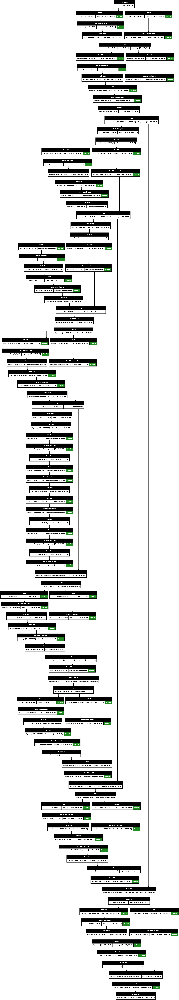

In [21]:
input_shape = (256, 256, 1)  # Adjust as per dataset
num_classes = 7  # Number of classes: ooplasm, PVS, ZP, background
model = build_model(input_shape, num_classes)
model.summary(expand_nested=True, show_trainable=True)
tf.keras.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## Model Building & Callbacks

In [22]:
!ls -ld '/content/gdrive/My Drive/My_ProjectWorkshop_2425'

drwx------ 15 root root 4096 Dec  4 09:12 '/content/gdrive/My Drive/My_ProjectWorkshop_2425'


In [23]:
#Build Model --> instantiate the weights of the defined architecture according to the choosen mode

model = build_model(input_shape, num_classes)

#mode.compile --> define loss, optimizer and metrics to be used during training

model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=1e-03),
              loss =  DiceFocalLoss(alpha=0.3, beta=0.7),
              metrics = [Mean_DICE(num_classes = NUM_CLASSES)]
              )

#Create a directory tree to neatly save the models
training_path = os.path.join(WD_PATH, 'Training_' + datetime.now(gettz("Europe/Rome")).strftime("%Y-%m-%d-T%H:%M"))
checkpoint_path = os.path.join(training_path, 'Checkpoints')
best_model_path = os.path.join(training_path, 'Best Model')

if not os.path.exists(training_path):
    os.mkdir(training_path)
if not os.path.exists(checkpoint_path):
    os.mkdir(checkpoint_path)
if not os.path.exists(best_model_path):
    os.mkdir(best_model_path)

#Callback to keep track of the model with the best validation Mean_DICE

best_model_callback = tf.keras.callbacks.ModelCheckpoint(filepath = f'{best_model_path}/Model.keras',
                                                          monitor = 'val_loss',
                                                          mode = 'min',
                                                          save_best_only = True)

#Callback to avoid overfitting
callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                            mode = 'min',
                                            patience = 5,
                                            restore_best_weights = True)


#Callback for the tensorboard monitoring

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = checkpoint_path,
                                                       histogram_freq = 1)

## Tensorboard

In [24]:
!kill $(sudo lsof -t -i:6006)

kill: usage: kill [-s sigspec | -n signum | -sigspec] pid | jobspec ... or kill -l [sigspec]


In [25]:
%load_ext tensorboard

In [26]:
%tensorboard --logdir "$checkpoint_path"

<IPython.core.display.Javascript object>

In [27]:
#if the upper row doesn't work, run this after
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")

Try `serve_kernel_port_as_iframe` instead. 


<IPython.core.display.Javascript object>

## Model Training & Evaluation

In [28]:
from sklearn.model_selection import KFold

k_folds = 5
kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)

In [29]:
x = np.concatenate((x_train, x_val), axis=0)
y = np.concatenate((y_train, y_val), axis=0)

In [31]:
for fold, (train_index, val_index) in enumerate(kfold.split(x, y)):
    print(f"Fold {fold+1}")

    x_train_fold, x_val_fold = x[train_index], x[val_index]
    y_train_fold, y_val_fold = y[train_index], y[val_index]

    model = build_model(input_shape, NUM_CLASSES)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss = DiceFocalLoss(alpha=0.3, beta=0.7),
        metrics = [Mean_DICE(num_classes = NUM_CLASSES)]
    )

    # Configure ModelCheckpoint for this fold
    model_directory = f"{training_path}/Best_model_fold{fold+1}"
    best_model_callback = tf.keras.callbacks.ModelCheckpoint(filepath = f'{model_directory}/Model.keras',
                                                          monitor = 'val_loss',
                                                          mode = 'min',
                                                          save_best_only = True)

    #Callback to avoid overfitting
    callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                            mode = 'min',
                                            patience = 5,
                                            restore_best_weights = True)

    # Train the model
    history = model.fit(
        x_train_fold,
        y_train_fold,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        validation_data=(x_val_fold, y_val_fold),
        callbacks=[best_model_callback,callback]
    )

Fold 1
Epoch 1/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 132s 838ms/step - Mean_DICE: 0.2460 - loss: 0.3507 - val_Mean_DICE: 0.1551 - val_loss: 0.3637
Epoch 2/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - Mean_DICE: 0.3868 - loss: 0.2080 - val_Mean_DICE: 0.1459 - val_loss: 0.3745
Epoch 3/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - Mean_DICE: 0.5328 - loss: 0.1615 - val_Mean_DICE: 0.1367 - val_loss: 0.4464
Epoch 4/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - Mean_DICE: 0.7603 - loss: 0.0974 - val_Mean_DICE: 0.1349 - val_loss: 0.4676
Epoch 5/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 11s 138ms/step - Mean_DICE: 0.8642 - loss: 0.0527 - val_Mean_DICE: 0.2249 - val_loss: 0.3190
Epoch 6/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - Mean_DICE: 0.8871 - loss: 0.0414 - val_Mean_DICE: 0.4654 - val_loss: 0.1714
Epoch 7/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - Mean_DICE: 0.8960 - loss: 0.0379 - val_Mean_DICE: 0.8141 - val_loss: 0.0723
Epoch 8/70
74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - Mean_DICE: 0.9008 - l

In [32]:
from tensorflow.keras.models import load_model
import builtins

scores = []

for fold in range(5):
    model_directory = f"{training_path}/Best_model_fold{fold+1}/Model.keras"
    #model_directory = f"Training_1/Best_model_fold{fold+1}/Model.keras"

    model = tf.keras.models.load_model(model_directory,
                                        custom_objects = {'DiceFocalLoss': DiceFocalLoss(alpha=0.3, beta=0.7),
                                                          'Mean_DICE': Mean_DICE(num_classes = 7)})

    score = model.evaluate(x_test, y_test, verbose=2)
    scores.append(score)

best_model_idx = scores.index(builtins.min(scores))

3/3 - 25s - 8s/step - Mean_DICE: 0.9290 - loss: 0.0232
3/3 - 7s - 2s/step - Mean_DICE: 0.9322 - loss: 0.0228
3/3 - 7s - 2s/step - Mean_DICE: 0.9325 - loss: 0.0229


3/3 - 7s - 2s/step - Mean_DICE: 0.9339 - loss: 0.0215


3/3 - 6s - 2s/step - Mean_DICE: 0.9309 - loss: 0.0217


In [34]:
#Load the best model saved by training tf.keras.callbacks.ModelCheckpoint callback
best_model = tf.keras.models.load_model(f"{training_path}/Best_model_fold{1}/Model.keras",
                                        custom_objects = {'DiceFocalLoss': DiceFocalLoss(alpha=0.3, beta=0.7),
                                            'Mean_DICE': Mean_DICE(num_classes = 7)})

In [35]:
#Network evaluation on the test set
test_scores = best_model.evaluate(x = x_test, y = y_test, verbose = 2)

3/3 - 6s - 2s/step - Mean_DICE: 0.9290 - loss: 0.0232


## Predictions

In [36]:
predictions = best_model.predict(x_test)
print('prediction shape: {}'.format(predictions.shape))

3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step
prediction shape: (82, 256, 256, 7)


## Postprocessing

In [37]:
def softmax_to_one_hot(softmax_output):
    """
    Converts the softmax output into a one-hot representation per pixel.
    Args:
        softmax_output (numpy.ndarray): 3D array of dimensions (H, W, C),
                                        where H and W are the image dimensions,
                                        and C is the number of classes.
    Returns:
        numpy.ndarray: 3D array of dimensions (H, W, C) with 0s and 1s.
    """

    max_indices = np.argmax(softmax_output, axis=-1) #max proba

    one_hot_output = np.zeros_like(softmax_output)
    np.put_along_axis(one_hot_output, np.expand_dims(max_indices, axis=-1), 1, axis=-1)

    return one_hot_output

In [38]:
one_hot_output = softmax_to_one_hot(predictions)

print("one-hot shape :", one_hot_output.shape)

predictions = one_hot_output

one-hot shape : (82, 256, 256, 7)


In [39]:
from sklearn.metrics import precision_score, recall_score

#Initialise
precisions = []
recalls = []

for class_index in range(NUM_CLASSES):
  precisions_classe = []
  recalls_classe = []

  for i in range(y_test.shape[0]):
      y_pred = predictions[i,:,:,class_index].flatten()
      y_true = y_test[i,:,:,class_index].flatten()

      precision = precision_score(y_true, y_pred, zero_division=0)
      recall = recall_score(y_true, y_pred)

      precisions_classe.append(precision)
      recalls_classe.append(recall)

  precisions.append([np.mean(precisions_classe),np.std(precisions_classe)])
  recalls.append([np.mean(recalls_classe), np.std(recalls_classe)])
# Print Results
for i in range(7):
    print(f"Classe {i}: Precision = {precisions[i][0]:.2f} ± {precisions[i][1]:.2f}, Recall = {recalls[i][0]:.2f} ± {recalls[i][1]:.2f}")

Classe 0: Precision = 0.99 ± 0.00, Recall = 0.99 ± 0.00
Classe 1: Precision = 0.91 ± 0.05, Recall = 0.94 ± 0.05
Classe 2: Precision = 0.88 ± 0.07, Recall = 0.92 ± 0.03
Classe 3: Precision = 0.90 ± 0.06, Recall = 0.87 ± 0.10
Classe 4: Precision = 0.96 ± 0.02, Recall = 0.97 ± 0.02
Classe 5: Precision = 0.95 ± 0.02, Recall = 0.93 ± 0.02
Classe 6: Precision = 0.98 ± 0.01, Recall = 0.96 ± 0.01


## Predictions Plotting

Img n°:  0


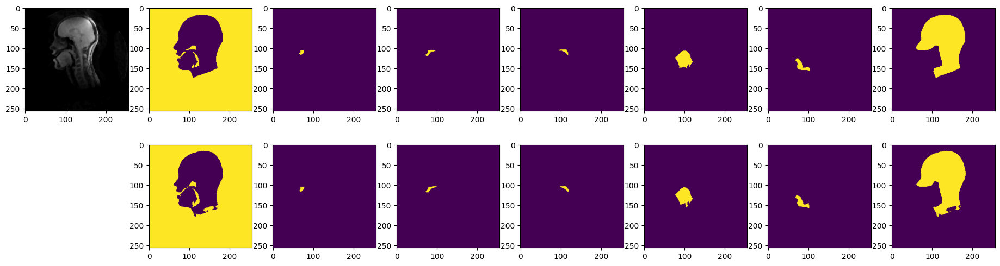

Img n°:  1


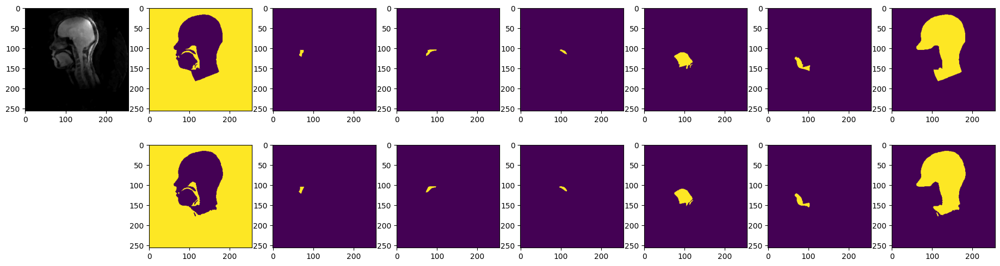

Img n°:  2


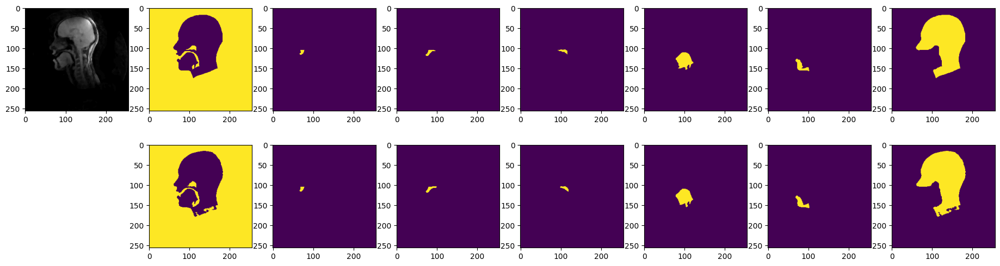

Img n°:  3


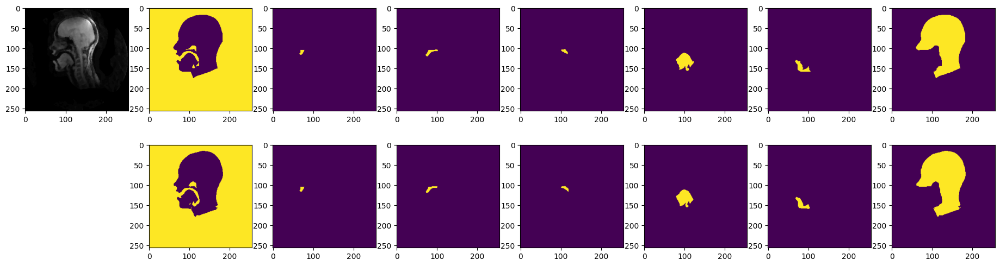

Img n°:  4


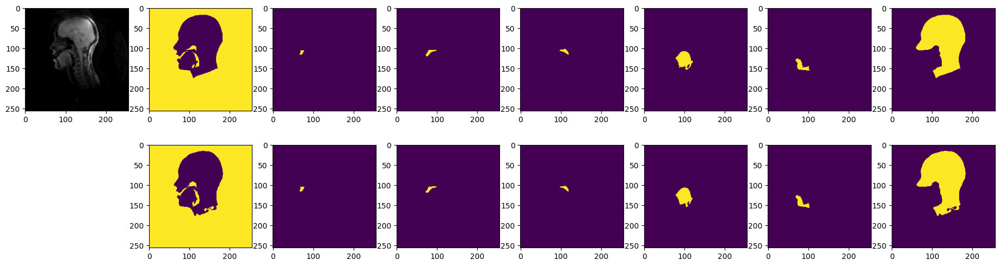

Img n°:  5


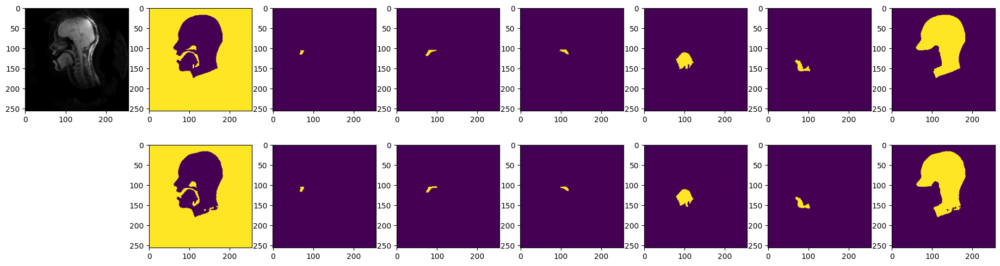

In [40]:
n = 0
for volume, label in zip(x_test, y_test):
    if n > 5:
      break
    print("Img n°: ", n)

    fig = plt.figure(figsize = [23, 6])     #generate the withe figure (background)
    plt.subplot(2, (NUM_CLASSES + 1), 1)    #define the grid size (r, c, index) (index must be >= 1)
    plt.imshow(volume[:,:,0], cmap="gray")  #dsMRI image plotting

    for i in range(NUM_CLASSES): #iteration over classes for each image

        plt.subplot(2, (NUM_CLASSES + 1), i+2)  #index moving to identify the correct grid coordinate
        plt.imshow(label[:,:,i])                #Ground Truth plotting
        plt.subplot(2, (NUM_CLASSES + 1), i+10) #index moving to identify the correct grid coordinate
        plt.imshow(predictions[n,:,:,i])        # <--------- Here the predictions plotting

    n = n + 1
    plt.show(fig) #subplot figure plotting

## 🧑 Patient 1 MICROSCOPIC

In [41]:
PATIENT_PATH = os.path.join(WD_PATH, 'Dataset', 'MICROSCOPIC_01')


In [42]:
def load_patient(patient_path):
  '''
  GET : Patient path
  RETURN : Patient images (ndarry format)
  '''
  image_patient = []
  for filename in os.listdir(PATIENT_PATH):
      if filename.endswith('.png'):
          file_path = os.path.join(PATIENT_PATH, filename)

          image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

          if image is not None:
              image = cv2.resize(image, (256, 256))
              image = image / 255.0
              image_patient.append(image)
          else:
              print(f"Erreur: Impossible de charger l'image {filename}")

  image_patient = np.array(image_patient)

  return image_patient

In [43]:
image_patient = load_patient(PATIENT_PATH)
image_patient = image_patient.reshape(image_patient.shape[0], image_patient.shape[1], image_patient.shape[2], 1)

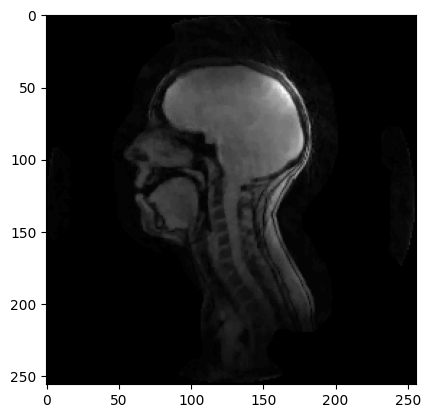

In [44]:
plt.imshow(image_patient[0], cmap="gray")

In [45]:
predictions = best_model.predict(image_patient)
print('prediction shape: {}'.format(predictions.shape))
predictions = softmax_to_one_hot(predictions)

4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step
prediction shape: (118, 256, 256, 7)


Img n°:  0


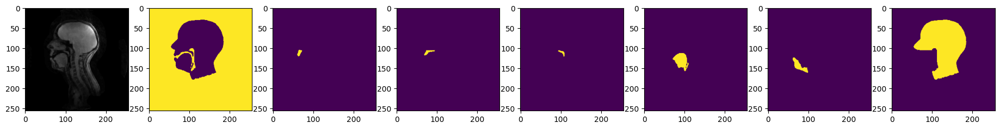

Img n°:  1


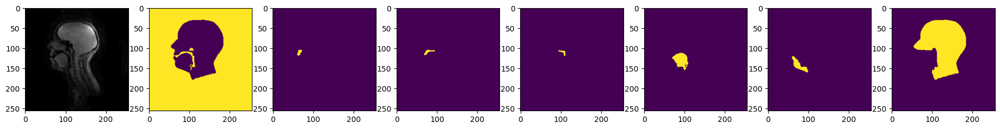

Img n°:  2


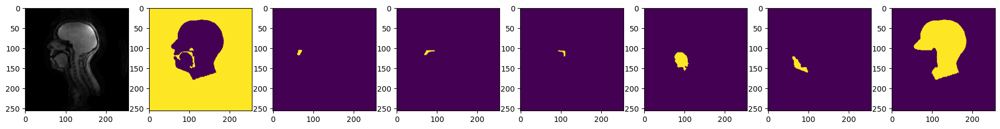

Img n°:  3


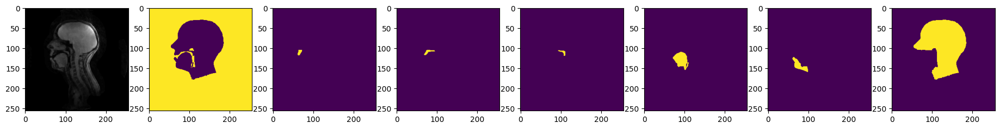

Img n°:  4


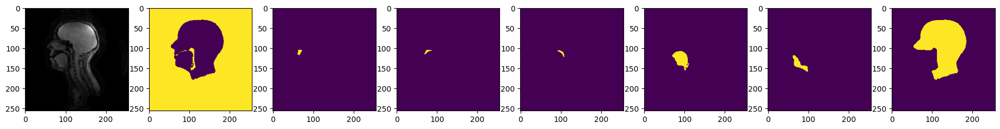

In [46]:
n = 0
for image in image_patient:
    while n < 5:
      print("Img n°: ", n)

      fig = plt.figure(figsize = [23, 6])     #generate the withe figure (background)
      plt.subplot(2, 8, 1)    #define the grid size (r, c, index) (index must be >= 1)
      plt.imshow(image, cmap="gray")  #dsMRI image plotting

      for i in range(7): #iteration over classes for each image

          plt.subplot(2, 8, i+2)  #index moving to identify the correct grid coordinate
          plt.imshow(predictions[n,:,:,i])

      n = n + 1
      plt.show(fig) #subplot figure plotting
n = 0

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Define colors for each class
colors = [
    [0, 0, 0],    # Black for class 0
    [0, 255, 0],    # Green for class 1
    [255,165,0],    # Bleu for class 2
    [255, 255, 0],  # Yellow for class 3
    [255, 0, 255],  # Violet for class 4
    [0, 255, 255],  # Cyan for class 5
    [255, 255, 255] # White for class 6
]


# Initialize blank
height, width, num_classes = predictions.shape[1:]

merge_mask = []
for n in range(predictions.shape[0]):
  merged_image = np.zeros((height, width, 3), dtype=np.uint8)
  # For each pixel select the best probabilti of presence
  for i in range(height):
      for j in range(width):
          class_index = np.argmax(predictions[n, i, j, :])
          merged_image[i, j, :] = colors[class_index]

  merge_mask.append(merged_image)

merge_mask = np.array(merge_mask)

Img n°:  0


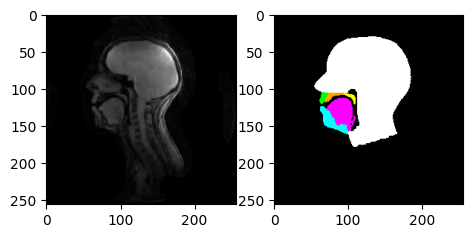

Img n°:  1


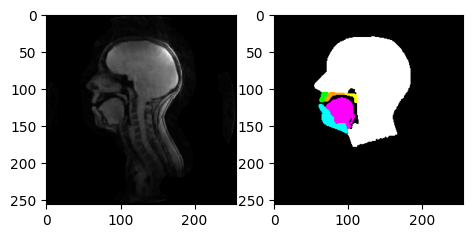

Img n°:  2


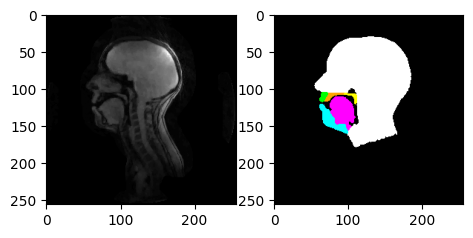

Img n°:  3


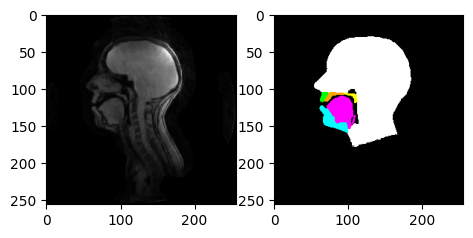

Img n°:  4


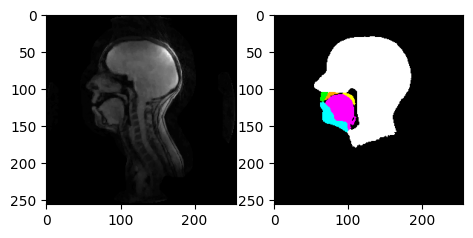

In [48]:
n = 0
for image in image_patient:
    while n < 5:
      print("Img n°: ", n)

      fig = plt.figure(figsize = [23, 6])     #generate the white figure (background)
      plt.subplot(2, 8, 1)    #define the grid size (r, c, index) (index must be >= 1)
      plt.imshow(image, cmap="gray")  #dsMRI image plotting



      plt.subplot(2, 8, 2)  #index moving to identify the correct grid coordinate
      plt.imshow(merge_mask[n,:,:,:])

      n = n + 1
      plt.show(fig) #subplot figure plotting
n = 0

## Garbage collector


In [49]:
del x_train, x_test, x_val, y_train, y_test, y_val
del model
import gc
gc.collect()

82627